# Load file

In [1]:
import numpy as np
import sklearn as sk
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics

from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import make_scorer
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc, roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report,average_precision_score
from lightgbm import LGBMClassifier

import seaborn as sns
from pylab import rcParams
import pickle
from sklearn import metrics
from sklearn.decomposition import PCA

from pyod.utils.example import visualize
import warnings
import matplotlib.font_manager
warnings.filterwarnings("ignore")

In [2]:
df_path = "C:/Users/Enduser/OneDrive - Asia Pacific University/uni/Y3S2/fyp/Model_trial/btc_trial_dataset2.csv"
dataset_df = pd.read_csv(df_path)

# Drop

In [3]:
drop_cols = ['tx_hash', 'is_malicious', 'all_malicious', 'mean_in_btc', 'mean_out_btc','in_malicious']
dataset_df.drop(columns=drop_cols, inplace=True)

In [4]:
dataset_df.head()

,indegree,outdegree,in_btc,out_btc,total_btc,out_malicious,out_and_tx_malicious
0,4,2,0.478187,0.476987,0.955174,0,0
1,3,2,2.019000,2.018500,4.037500,0,0
2,1,1,0.180100,0.180100,0.360200,0,0
3,1,2,5.879800,5.879300,11.759100,0,0
4,4,2,0.495906,0.495406,0.991312,0,0


# Spilt

In [5]:
from sklearn.model_selection import train_test_split

# Load dataset
X = dataset_df.drop('out_and_tx_malicious', axis=1)
y = dataset_df['out_and_tx_malicious']

# Split dataset into Train (80%) and Test (20%) ensuring stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Further split Train into Train (90%) and Validation (10%)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.10, stratify=y_train, random_state=42
)

print("Data Split Complete:")
print(f"Train Size: {X_train.shape[0]}")
print(f"Validation Size: {X_val.shape[0]}")
print(f"Test Size: {X_test.shape[0]}")


Data Split Complete:
Train Size: 72000
Validation Size: 8000
Test Size: 20000


# log

In [6]:

# Define features for log transformation
log_features = ['indegree', 'outdegree', 'in_btc', 'out_btc', 'total_btc']

# Apply log transformation
for df in [X_train, X_val, X_test]:  
    df[log_features] = np.log1p(df[log_features])  # log1p avoids log(0)

print("Log Transformation Complete")
# View before and after log transformation for a sample feature
# feature_to_view = 'in_btc'

# print("\nBefore Log Transformation:")
# print(X_train[feature_to_view].head())

# print("\nAfter Log Transformation:")
# print(np.log1p(X_train[feature_to_view].head()))

Log Transformation Complete


# Feature engineer

In [7]:
# Feature Engineering Function
def add_features(df):
    df['out_malicious_to_total_btc'] = df['out_malicious'] / (df['total_btc'] + 1e-6)
    df['log_total_btc'] = np.log1p(df['total_btc'])
    df['out_malicious_in_btc_interaction'] = df['out_malicious'] * df['in_btc']
    df['net_btc_flow'] = df['in_btc'] - df['out_btc']
    return df

# Apply feature engineering to Train, Validation, and Test sets
X_train_fe = add_features(X_train)
X_val_fe = add_features(X_val)
X_test_fe = add_features(X_test)

# Select the final set of features
selected_features = [
    'in_btc', 'out_btc', 'total_btc', 'out_malicious', 'indegree','outdegree',
    'out_malicious_to_total_btc', 'log_total_btc',
    'out_malicious_in_btc_interaction', 'net_btc_flow'
]

X_train_final = X_train_fe[selected_features]
X_val_final = X_val_fe[selected_features]
X_test_final = X_test_fe[selected_features]

print("Feature Engineering Complete")


Feature Engineering Complete


# Smote

In [8]:
from imblearn.over_sampling import SMOTE
import pandas as pd

# Apply SMOTE to handle class imbalance
smote = SMOTE(sampling_strategy=0.01, random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_final, y_train)

print("Class distribution after SMOTE:")
print(pd.Series(y_train_smote).value_counts())


Class distribution after SMOTE:
out_and_tx_malicious
0    71923
1      719
Name: count, dtype: int64


# Robust scale

In [9]:
from sklearn.preprocessing import RobustScaler

# Initialize RobustScaler
scaler = RobustScaler()

# Fit and transform Train set
X_train_scaled = scaler.fit_transform(X_train_smote)

# Transform Validation and Test sets using the same scaler
X_val_scaled = scaler.transform(X_val_final)
X_test_scaled = scaler.transform(X_test_final)

# Convert back to DataFrame
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_final.columns)
X_val_scaled_df = pd.DataFrame(X_val_scaled, columns=X_val_final.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test_final.columns)

print("Scaling Complete")


Scaling Complete


-------------------------------------------

# LightGBM Model Building

In [11]:
# Compute scale_pos_weight
scale_pos_weight = np.sum(y_train_smote == 0) / np.sum(y_train_smote == 1)
print(f"Computed scale_pos_weight: {scale_pos_weight:.2f}")

Computed scale_pos_weight: 100.03


In [12]:
from lightgbm import early_stopping, log_evaluation

# Initialize LGBMClassifier
lgbm = LGBMClassifier(
    n_estimators=1000,
    boosting_type='gbdt',
    objective='binary',
    metric='auc',
    scale_pos_weight=scale_pos_weight,
    random_state=42
)

# Fit the model with early stopping using callbacks
lgbm.fit(
    X_train_scaled_df,
    y_train_smote,
    eval_set=[(X_val_scaled_df, y_val)],
    eval_metric='auc',
    callbacks=[early_stopping(stopping_rounds=10), log_evaluation(1)]
)

[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[1]	valid_0's auc: 0.944549
Training until validation scores don't improve for 10 rounds
[2]	valid_0's auc: 0.978191
[3]	valid_0's auc: 0.89874
[4]	valid_0's auc: 0.899088
[5]	valid_0's auc: 0.893269
[6]	valid_0's auc: 0.893922
[7]	valid_0's auc: 0.894256
[8]	valid_0's auc: 0.894214
[9]	valid_0's auc: 0.894117
[10]	valid_0's auc: 0.894326
[11]	valid_0's auc: 0.893978
[12]	valid_0's auc: 0.894423
Early stopping, best iteration is:
[2]	valid_

LGBMClassifier(metric='auc', n_estimators=1000, objective='binary',
               random_state=42,
               scale_pos_weight=np.float64(100.03198887343532))

 - low precision

In [13]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix

# Compute predicted probabilities
y_pred_proba = lgbm.predict_proba(X_test_scaled)[:, 1]

# Compute precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

# Find threshold maximizing F1-score (or adjust for higher recall)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal threshold (max F1): {optimal_threshold:.4f}")

# Apply optimal threshold
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)
print("Classification Report (Optimal Threshold):")
# Print the classification report
print(classification_report(y_test, y_pred_optimal))

# Print the confusion matrix
cm_optimal = confusion_matrix(y_test, y_pred_optimal)
print("Confusion Matrix (Optimal Threshold):")
print(cm_optimal)

Optimal threshold (max F1): 0.9960
Classification Report (Optimal Threshold):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19978
           1       0.58      0.68      0.62        22

    accuracy                           1.00     20000
   macro avg       0.79      0.84      0.81     20000
weighted avg       1.00      1.00      1.00     20000

Confusion Matrix (Optimal Threshold):
[[19967    11]
 [    7    15]]


# Grid Search

In [21]:
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 50, 100],
    'max_depth': [3, 5, 7],
    'min_data_in_leaf': [20, 50, 100]
}

In [37]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier

# Initialize the LightGBM model
lgbm = LGBMClassifier(n_estimators=1000, objective='binary', random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    scoring='roc_auc',  # Metric to optimize 
    cv=3,              # 3-fold cross-validation
    n_jobs=-1          # Use all CPU cores
)

# Fit to training data
grid_search.fit(X_train_scaled, y_train_smote)

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

GridSearchCV(cv=3,
             estimator=LGBMClassifier(n_estimators=1000, objective='binary',
                                      random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 7],
                         'min_data_in_leaf': [20, 50, 100],
                         'num_leaves': [31, 50, 100]},
             scoring='roc_auc')

In [38]:
# Best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Best model
best_lgbm = grid_search.best_estimator_

Best Hyperparameters: {'learning_rate': 0.05, 'max_depth': 7, 'min_data_in_leaf': 20, 'num_leaves': 31}


In [39]:
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Initialize the LightGBM model with the best hyperparameters
lgbm_model = LGBMClassifier(
    learning_rate=0.05,
    max_depth=7,
    min_data_in_leaf=20,
    num_leaves=31,
    n_estimators=1000,  # Number of boosting rounds
    random_state=42
)

# Train the model on the training data
lgbm_model.fit(X_train_scaled, y_train_smote)

# Predict on the test set
y_pred = lgbm_model.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

 - low recall

# save best model

In [36]:
import joblib

joblib.dump(lgbm_model, 'lgbm_model.pkl')  
joblib.dump(scaler, 'scaler_lgbm.pkl')      

['scaler_lgbm.pkl']

# optuna tuning 1


In [14]:
import optuna
from sklearn.metrics import f1_score
def objective(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'num_leaves': trial.suggest_int('num_leaves', 31, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 7),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 100)
    }
    lgbm = LGBMClassifier(**param, n_estimators=1000, random_state=42)
    lgbm.fit(X_train_scaled, y_train_smote)
    y_pred = lgbm.predict(X_test_scaled)

    return f1_score(y_test, y_pred)
   
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

[I 2025-04-03 11:19:38,502] A new study created in memory with name: no-name-849e0432-6a96-4a7f-9059-925ec54bac11


[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:19:41,979] Trial 0 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 0.08732738799206646, 'num_leaves': 73, 'max_depth': 4, 'min_data_in_leaf': 48}. Best is trial 0 with value: 0.6666666666666666.


[LightGBM] [Warning] min_data_in_leaf is set=83, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=83
[LightGBM] [Warning] min_data_in_leaf is set=83, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=83
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:19:45,289] Trial 1 finished with value: 0.6190476190476191 and parameters: {'learning_rate': 0.0768335386257069, 'num_leaves': 82, 'max_depth': 4, 'min_data_in_leaf': 83}. Best is trial 0 with value: 0.6666666666666666.


[LightGBM] [Warning] min_data_in_leaf is set=96, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=96
[LightGBM] [Warning] min_data_in_leaf is set=96, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=96
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:19:48,213] Trial 2 finished with value: 0.7368421052631579 and parameters: {'learning_rate': 0.02410556128820051, 'num_leaves': 59, 'max_depth': 4, 'min_data_in_leaf': 96}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:19:53,466] Trial 3 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.08753117122862562, 'num_leaves': 83, 'max_depth': 7, 'min_data_in_leaf': 20}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:19:57,517] Trial 4 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.05338397237179875, 'num_leaves': 34, 'max_depth': 6, 'min_data_in_leaf': 27}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=35, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=35
[LightGBM] [Warning] min_data_in_leaf is set=35, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=35
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:01,509] Trial 5 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.03472354062910657, 'num_leaves': 82, 'max_depth': 6, 'min_data_in_leaf': 35}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:04,266] Trial 6 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.035108905133934935, 'num_leaves': 57, 'max_depth': 3, 'min_data_in_leaf': 69}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=96, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=96
[LightGBM] [Warning] min_data_in_leaf is set=96, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=96
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:07,261] Trial 7 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.039946016294700105, 'num_leaves': 59, 'max_depth': 4, 'min_data_in_leaf': 96}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=51, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=51
[LightGBM] [Warning] min_data_in_leaf is set=51, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=51
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:20:09,865] Trial 8 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.09657107146981983, 'num_leaves': 98, 'max_depth': 3, 'min_data_in_leaf': 51}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=66, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=66
[LightGBM] [Warning] min_data_in_leaf is set=66, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=66
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:20:13,293] Trial 9 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.0880944140573756, 'num_leaves': 38, 'max_depth': 5, 'min_data_in_leaf': 66}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=97, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=97
[LightGBM] [Warning] min_data_in_leaf is set=97, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=97
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:17,094] Trial 10 finished with value: 0.7 and parameters: {'learning_rate': 0.010758615688520736, 'num_leaves': 47, 'max_depth': 5, 'min_data_in_leaf': 97}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=74, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=74
[LightGBM] [Warning] min_data_in_leaf is set=74, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=74
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:19,942] Trial 11 finished with value: 0.7317073170731707 and parameters: {'learning_rate': 0.010463876763635149, 'num_leaves': 57, 'max_depth': 3, 'min_data_in_leaf': 74}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=81, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=81
[LightGBM] [Warning] min_data_in_leaf is set=81, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=81
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:20:22,843] Trial 12 finished with value: 0.7317073170731707 and parameters: {'learning_rate': 0.010100292079964667, 'num_leaves': 49, 'max_depth': 3, 'min_data_in_leaf': 81}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=83, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=83
[LightGBM] [Warning] min_data_in_leaf is set=83, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=83
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:20:25,918] Trial 13 finished with value: 0.7 and parameters: {'learning_rate': 0.022404377866750484, 'num_leaves': 70, 'max_depth': 4, 'min_data_in_leaf': 83}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=77, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=77
[LightGBM] [Warning] min_data_in_leaf is set=77, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=77
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:28,668] Trial 14 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.02396209941653687, 'num_leaves': 62, 'max_depth': 3, 'min_data_in_leaf': 77}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:32,090] Trial 15 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.06142044450353481, 'num_leaves': 50, 'max_depth': 5, 'min_data_in_leaf': 92}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=57, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=57
[LightGBM] [Warning] min_data_in_leaf is set=57, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=57
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:35,147] Trial 16 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.022839804155318343, 'num_leaves': 41, 'max_depth': 4, 'min_data_in_leaf': 57}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=87, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=87
[LightGBM] [Warning] min_data_in_leaf is set=87, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=87
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:37,711] Trial 17 finished with value: 0.7027027027027027 and parameters: {'learning_rate': 0.05020005507627863, 'num_leaves': 68, 'max_depth': 3, 'min_data_in_leaf': 87}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=71, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=71
[LightGBM] [Warning] min_data_in_leaf is set=71, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=71
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:40,762] Trial 18 finished with value: 0.7368421052631579 and parameters: {'learning_rate': 0.018029013283434276, 'num_leaves': 54, 'max_depth': 4, 'min_data_in_leaf': 71}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=61, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=61
[LightGBM] [Warning] min_data_in_leaf is set=61, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=61
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:20:44,655] Trial 19 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.06920869783498775, 'num_leaves': 52, 'max_depth': 6, 'min_data_in_leaf': 61}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:48,262] Trial 20 finished with value: 0.6511627906976745 and parameters: {'learning_rate': 0.04408683872976649, 'num_leaves': 75, 'max_depth': 5, 'min_data_in_leaf': 43}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:51,604] Trial 21 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.01703988677976792, 'num_leaves': 63, 'max_depth': 4, 'min_data_in_leaf': 69}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=72, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=72
[LightGBM] [Warning] min_data_in_leaf is set=72, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=72
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:20:54,462] Trial 22 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.03138641355819932, 'num_leaves': 54, 'max_depth': 3, 'min_data_in_leaf': 72}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[I 2025-04-03 11:20:57,570] Trial 23 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.0181337535940531, 'num_leaves': 41, 'max_depth': 4, 'min_data_in_leaf': 100}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=76, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=76
[LightGBM] [Warning] min_data_in_leaf is set=76, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=76
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:01,723] Trial 24 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.027404686484260074, 'num_leaves': 46, 'max_depth': 3, 'min_data_in_leaf': 76}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=90, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=90
[LightGBM] [Warning] min_data_in_leaf is set=90, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=90
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:21:05,403] Trial 25 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.015643458714165014, 'num_leaves': 65, 'max_depth': 4, 'min_data_in_leaf': 90}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=62, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=62
[LightGBM] [Warning] min_data_in_leaf is set=62, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=62
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:21:10,130] Trial 26 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.04391401542994916, 'num_leaves': 59, 'max_depth': 5, 'min_data_in_leaf': 62}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=53, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=53
[LightGBM] [Warning] min_data_in_leaf is set=53, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=53
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:14,114] Trial 27 finished with value: 0.7368421052631579 and parameters: {'learning_rate': 0.029955916918735056, 'num_leaves': 56, 'max_depth': 4, 'min_data_in_leaf': 53}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Warning] min_data_in_leaf is set=55, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=55
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:17,836] Trial 28 finished with value: 0.7 and parameters: {'learning_rate': 0.0316919172174281, 'num_leaves': 31, 'max_depth': 4, 'min_data_in_leaf': 55}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:22,357] Trial 29 finished with value: 0.7 and parameters: {'learning_rate': 0.028111435583220747, 'num_leaves': 77, 'max_depth': 5, 'min_data_in_leaf': 43}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:21:27,023] Trial 30 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 0.06007527525513179, 'num_leaves': 69, 'max_depth': 4, 'min_data_in_leaf': 45}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Warning] min_data_in_leaf is set=52, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=52
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:21:30,318] Trial 31 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.01485375813391767, 'num_leaves': 55, 'max_depth': 3, 'min_data_in_leaf': 52}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=74, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=74
[LightGBM] [Warning] min_data_in_leaf is set=74, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=74
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:33,825] Trial 32 finished with value: 0.7 and parameters: {'learning_rate': 0.022340370299702192, 'num_leaves': 60, 'max_depth': 4, 'min_data_in_leaf': 74}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2025-04-03 11:21:37,966] Trial 33 finished with value: 0.6829268292682927 and parameters: {'learning_rate': 0.018089812478248025, 'num_leaves': 65, 'max_depth': 4, 'min_data_in_leaf': 64}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:40,989] Trial 34 finished with value: 0.7317073170731707 and parameters: {'learning_rate': 0.012023806042820787, 'num_leaves': 43, 'max_depth': 3, 'min_data_in_leaf': 36}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=81, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=81
[LightGBM] [Warning] min_data_in_leaf is set=81, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=81
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:44,563] Trial 35 finished with value: 0.6842105263157895 and parameters: {'learning_rate': 0.040425268505884696, 'num_leaves': 55, 'max_depth': 4, 'min_data_in_leaf': 81}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=86, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=86
[LightGBM] [Warning] min_data_in_leaf is set=86, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=86
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:50,032] Trial 36 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 0.026654595460422124, 'num_leaves': 51, 'max_depth': 7, 'min_data_in_leaf': 86}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=58, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=58
[LightGBM] [Warning] min_data_in_leaf is set=58, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=58
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:54,968] Trial 37 finished with value: 0.6341463414634146 and parameters: {'learning_rate': 0.035509602557792154, 'num_leaves': 72, 'max_depth': 6, 'min_data_in_leaf': 58}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:21:58,771] Trial 38 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.019835155949421812, 'num_leaves': 45, 'max_depth': 4, 'min_data_in_leaf': 36}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=24, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=24
[LightGBM] [Warning] min_data_in_leaf is set=24, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=24
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:02,882] Trial 39 finished with value: 0.7142857142857143 and parameters: {'learning_rate': 0.030817080913743005, 'num_leaves': 96, 'max_depth': 5, 'min_data_in_leaf': 24}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:06,768] Trial 40 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.03789380622021119, 'num_leaves': 57, 'max_depth': 3, 'min_data_in_leaf': 50}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Warning] min_data_in_leaf is set=80, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=80
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:10,976] Trial 41 finished with value: 0.7317073170731707 and parameters: {'learning_rate': 0.01009534278966891, 'num_leaves': 49, 'max_depth': 3, 'min_data_in_leaf': 80}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:15,179] Trial 42 finished with value: 0.7317073170731707 and parameters: {'learning_rate': 0.01331252918144779, 'num_leaves': 60, 'max_depth': 3, 'min_data_in_leaf': 69}. Best is trial 2 with value: 0.7368421052631579.


[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:18,419] Trial 43 finished with value: 0.75 and parameters: {'learning_rate': 0.010519424159959115, 'num_leaves': 52, 'max_depth': 3, 'min_data_in_leaf': 92}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Warning] min_data_in_leaf is set=93, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=93
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:21,779] Trial 44 finished with value: 0.7 and parameters: {'learning_rate': 0.019628615541188166, 'num_leaves': 54, 'max_depth': 3, 'min_data_in_leaf': 93}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[I 2025-04-03 11:22:25,650] Trial 45 finished with value: 0.6511627906976745 and parameters: {'learning_rate': 0.07855503983074699, 'num_leaves': 57, 'max_depth': 4, 'min_data_in_leaf': 100}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=95, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=95
[LightGBM] [Warning] min_data_in_leaf is set=95, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=95
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:28,726] Trial 46 finished with value: 0.717948717948718 and parameters: {'learning_rate': 0.02456091322882037, 'num_leaves': 63, 'max_depth': 3, 'min_data_in_leaf': 95}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=89, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=89
[LightGBM] [Warning] min_data_in_leaf is set=89, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=89
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:32,854] Trial 47 finished with value: 0.7 and parameters: {'learning_rate': 0.013629238428901536, 'num_leaves': 35, 'max_depth': 5, 'min_data_in_leaf': 89}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=84, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=84
[LightGBM] [Warning] min_data_in_leaf is set=84, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=84
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:36,602] Trial 48 finished with value: 0.7368421052631579 and parameters: {'learning_rate': 0.021994359731679635, 'num_leaves': 67, 'max_depth': 4, 'min_data_in_leaf': 84}. Best is trial 43 with value: 0.75.


[LightGBM] [Warning] min_data_in_leaf is set=85, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=85
[LightGBM] [Warning] min_data_in_leaf is set=85, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=85
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2025-04-03 11:22:40,219] Trial 49 finished with value: 0.6511627906976745 and parameters: {'learning_rate': 0.04814384747596266, 'num_leaves': 80, 'max_depth': 4, 'min_data_in_leaf': 85}. Best is trial 43 with value: 0.75.


In [22]:
best_trial = study.best_trial

# Print the best parameters and F1-score
print("Best Trial:")
print(f"  F1-Score on Validation Set: {best_trial.value:.4f}")
print("  Best Hyperparameters:")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

Best Trial:
  F1-Score on Validation Set: 0.7500
  Best Hyperparameters:
    learning_rate: 0.010519424159959115
    num_leaves: 52
    max_depth: 3
    min_data_in_leaf: 92


In [16]:
from lightgbm import LGBMClassifier
from lightgbm import early_stopping, log_evaluation

# Create the model with the best parameters
best_params = best_trial.params
lgbm_final = LGBMClassifier(
    **best_params,
    n_estimators=300,  # Keep high number of estimators
    random_state=42
)

# Train the model with early stopping 
lgbm_final.fit(
    X_train_scaled,
    y_train_smote,
    eval_set=[(X_val_scaled, y_val)],  # Use the scaled validation set
    eval_metric='auc',                  # Use AUC for early stopping 
    callbacks=[early_stopping(stopping_rounds=50), log_evaluation(10)]  # Early stopping and logging
)

[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Tra

LGBMClassifier(learning_rate=0.010519424159959115, max_depth=3,
               min_data_in_leaf=92, n_estimators=300, num_leaves=52,
               random_state=42)

- highest recall, need to run again

- view learning curve

[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
Optimal Threshold for F1-score (determined from test set): 0.2461
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004832 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] [binar

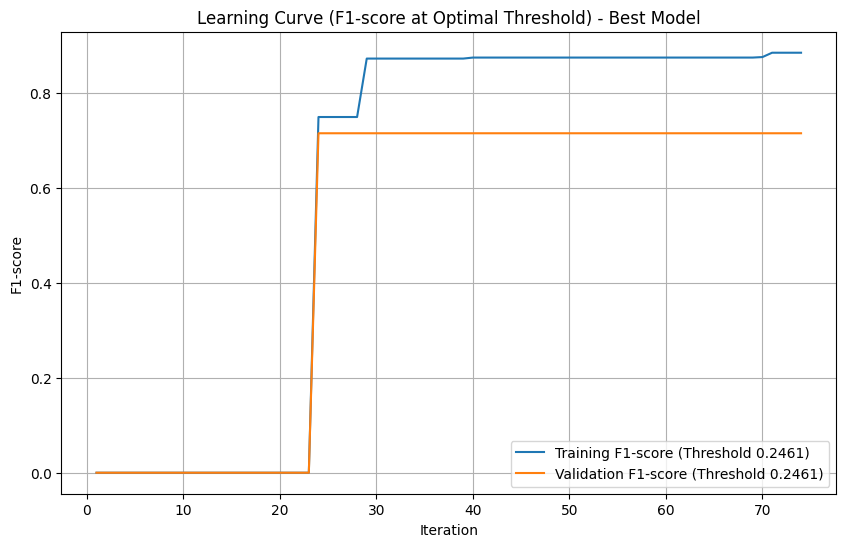

[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
Classification Report (Threshold 0.5):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19978
           1       0.00      0.00      0.00        22

    accuracy                           1.00     20000
   macro avg       0.50      0.50      0.50     20000
weighted avg       1.00      1.00      1.00     20000

AUC-ROC: 0.9452
Average Precision Score (AUC-PR): 0.6880
Confusion Matrix (Threshold 0.5):
[[19978     0]
 [   22     0]]
Optimal Threshold for F1-score: 0.2461
Classification Report with Optimal Threshold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19978
           1       1.00      0.64      0.78        22

    accuracy                           1.00     20000
   macro avg       1.00      0.82      0.89     20000
weighted avg       1.00      1.00

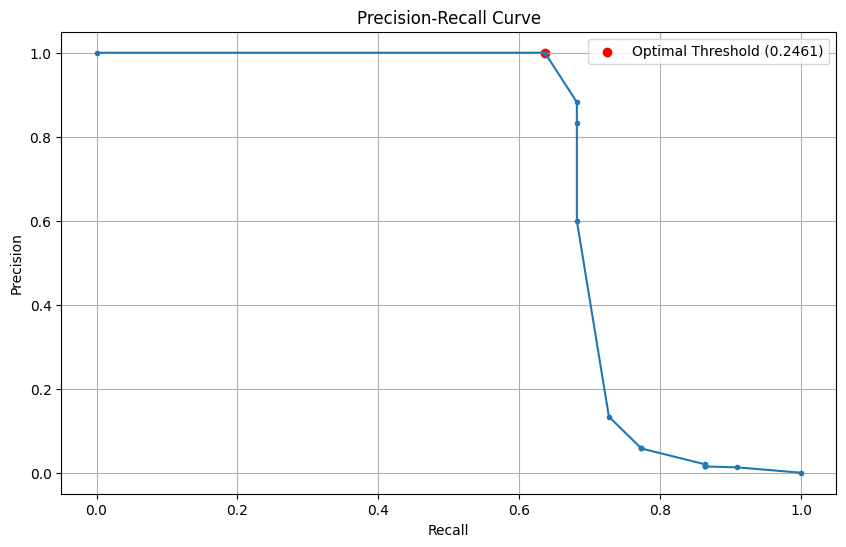

In [20]:
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score, precision_recall_curve, confusion_matrix, f1_score
from lightgbm import early_stopping, log_evaluation, record_evaluation
import matplotlib.pyplot as plt
import numpy as np

# Custom F1-score evaluation function using the optimal threshold (to be determined)
def f1_score_metric_optimal(y_true, y_pred, threshold=0.5):
    y_pred_binary = (y_pred >= threshold).astype(int)
    score = f1_score(y_true, y_pred_binary)
    return 'f1_optimal', score, True  # Name, score, higher_is_better

# First, determine the optimal threshold using the test set (as in your original code)
y_pred_proba = lgbm_final.predict_proba(X_test_scaled)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = np.nan_to_num(2 * (precision * recall) / (precision + recall), nan=0.0)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold for F1-score (determined from test set): {optimal_threshold:.4f}")

# Re-train the model to capture learning curve data with the optimal threshold
# Assuming lgbm_final was created with best_params, n_estimators, etc.
eval_results = {}
lgbm_final.fit(
    X_train_scaled,
    y_train_smote,
    eval_set=[(X_train_scaled, y_train_smote), (X_val_scaled, y_val)],
    eval_names=['train', 'validation'],
    eval_metric=lambda y_true, y_pred: f1_score_metric_optimal(y_true, y_pred, threshold=optimal_threshold),
    callbacks=[
        early_stopping(stopping_rounds=50),
        log_evaluation(10),
        record_evaluation(eval_results)
    ]
)

# Extract F1-score learning curve data (at optimal threshold)
train_f1 = eval_results['train']['f1_optimal']
val_f1 = eval_results['validation']['f1_optimal']
iterations = range(1, len(train_f1) + 1)

# Plot Learning Curve for F1-score at optimal threshold
plt.figure(figsize=(10, 6))
plt.plot(iterations, train_f1, label=f'Training F1-score (Threshold {optimal_threshold:.4f})')
plt.plot(iterations, val_f1, label=f'Validation F1-score (Threshold {optimal_threshold:.4f})')
plt.xlabel('Iteration')
plt.ylabel('F1-score')
plt.title('Learning Curve (F1-score at Optimal Threshold) - Best Model')
plt.legend()
plt.grid(True)
plt.show()

# Continue with your original evaluation on the test set
# Predict probabilities and classes on the test set
y_pred = lgbm_final.predict(X_test_scaled)  # Predicted classes with default threshold (0.5)

# Classification report with default threshold
print("Classification Report (Threshold 0.5):")
print(classification_report(y_test, y_pred))

# AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_proba)
print(f"AUC-ROC: {auc_roc:.4f}")

# Average Precision Score (AUC-PR)
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"Average Precision Score (AUC-PR): {auc_pr:.4f}")

# Confusion matrix with default threshold
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix (Threshold 0.5):")
print(cm)

# Precision-Recall curve and optimal threshold (already computed, but for consistency)
print(f"Optimal Threshold for F1-score: {optimal_threshold:.4f}")

# Predictions with optimal threshold
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)
print("Classification Report with Optimal Threshold:")
print(classification_report(y_test, y_pred_optimal))

# Confusion matrix with optimal threshold
cm_optimal = confusion_matrix(y_test, y_pred_optimal)
print("Confusion Matrix with Optimal Threshold:")
print(cm_optimal)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.')
plt.scatter(recall[optimal_idx], precision[optimal_idx], color='red', label=f'Optimal Threshold ({optimal_threshold:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()

trial -bad 
lgbm_final_best_model_optimal_threshold --model 2

[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 575, number of negative: 57538
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1822
[LightGBM] [Info] Number of data points in the train set: 58113, number of used features: 10
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009895 -> initscore=-4.605831
[LightGBM] [Info] Start training from score -4.605831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Tra

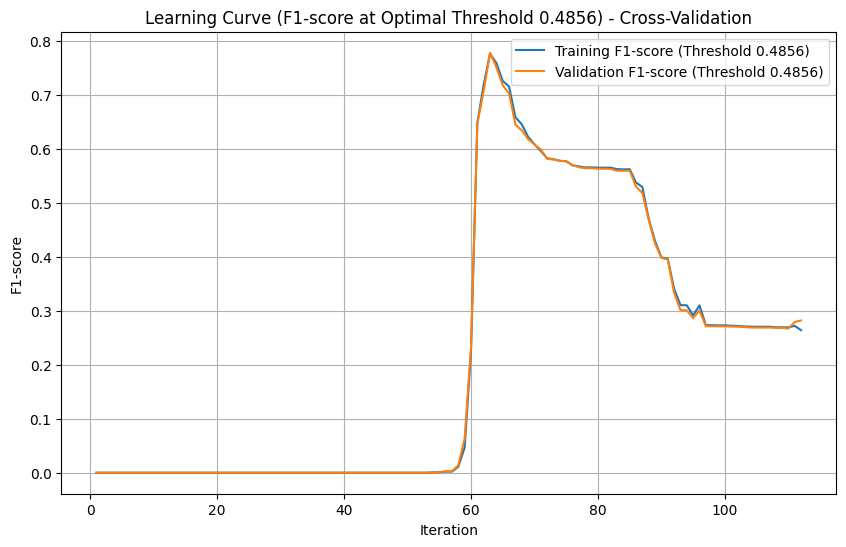

[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 20 rounds
[Light

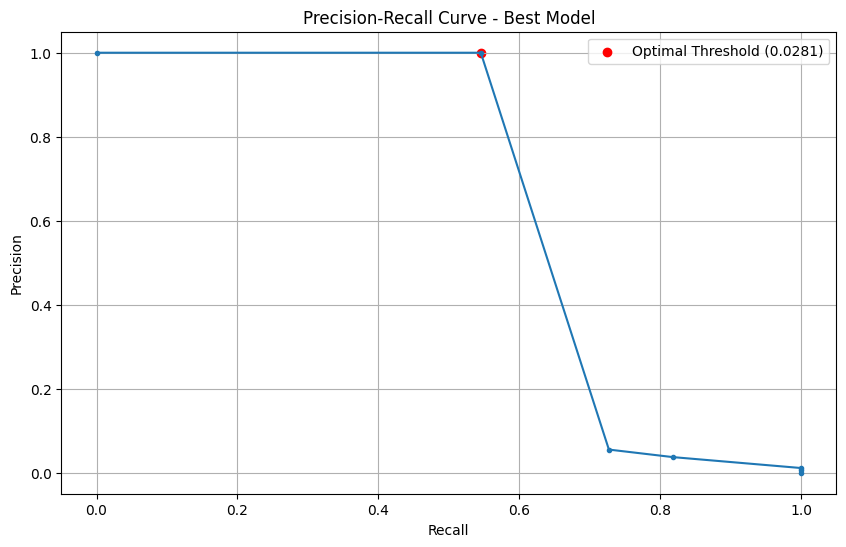

In [ ]:
import optuna
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score, precision_recall_curve, confusion_matrix, f1_score
from sklearn.model_selection import StratifiedKFold
from lightgbm import LGBMClassifier, early_stopping, log_evaluation, record_evaluation
import matplotlib.pyplot as plt
import numpy as np
import joblib

# Custom F1-score evaluation function with optimal threshold
def f1_score_metric_optimal(y_true, y_pred):
    optimal_threshold = 0.4856
    y_pred_binary = (y_pred >= optimal_threshold).astype(int)
    score = f1_score(y_true, y_pred_binary)
    return 'f1_optimal', score, True

# Best parameters 
best_params = {
    'learning_rate': study.best_trial.params['learning_rate'],
    'num_leaves': study.best_trial.params['num_leaves'],
    'max_depth': study.best_trial.params['max_depth'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf']
}

# Adjust scale_pos_weight
scale_pos_weight = np.sum(y_train_smote == 0) / np.sum(y_train_smote == 1) * 2

# K-Fold Cross-Validation for Learning Curve
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
train_f1_scores = []
val_f1_scores = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_scaled, y_train_smote)):
    X_train_fold = X_train_scaled[train_idx]
    y_train_fold = y_train_smote.iloc[train_idx]
    X_val_fold = X_train_scaled[val_idx]
    y_val_fold = y_train_smote.iloc[val_idx]

    lgbm_fold = LGBMClassifier(
        **best_params,
        n_estimators=1000,
        scale_pos_weight=scale_pos_weight,
        random_state=42
    )
    eval_results = {}
    lgbm_fold.fit(
        X_train_fold,
        y_train_fold,
        eval_set=[(X_train_fold, y_train_fold), (X_val_fold, y_val_fold)],
        eval_names=['train', 'validation'],
        eval_metric=[f1_score_metric_optimal],
        callbacks=[
            early_stopping(stopping_rounds=100),
            log_evaluation(0),
            record_evaluation(eval_results)
        ]
    )

    train_f1_scores.append(eval_results['train']['f1_optimal'])
    val_f1_scores.append(eval_results['validation']['f1_optimal'])

# Average F1-scores across folds
max_iterations = max(len(scores) for scores in train_f1_scores)
train_f1_avg = np.zeros(max_iterations)
val_f1_avg = np.zeros(max_iterations)
for i in range(max_iterations):
    train_vals = [scores[i] for scores in train_f1_scores if i < len(scores)]
    val_vals = [scores[i] for scores in val_f1_scores if i < len(scores)]
    train_f1_avg[i] = np.mean(train_vals)
    val_f1_avg[i] = np.mean(val_vals)

# Plot Learning Curve
iterations = range(1, max_iterations + 1)
plt.figure(figsize=(10, 6))
plt.plot(iterations, train_f1_avg, label='Training F1-score (Threshold 0.4856)')
plt.plot(iterations, val_f1_avg, label='Validation F1-score (Threshold 0.4856)')
plt.xlabel('Iteration')
plt.ylabel('F1-score')
plt.title('Learning Curve (F1-score at Optimal Threshold 0.4856) - Cross-Validation')
plt.legend()
plt.grid(True)
plt.show()

# Train final model on full training data
lgbm_final = LGBMClassifier(
    **best_params,
    n_estimators=1000,
    scale_pos_weight=scale_pos_weight,
    random_state=42
)
lgbm_final.fit(
    X_train_scaled,
    y_train_smote,
    eval_set=[(X_val_scaled, y_val)],
    eval_metric=[f1_score_metric_optimal],
    callbacks=[
        early_stopping(stopping_rounds=20),
        log_evaluation(10)
    ]
)

# Save the model
joblib.dump(lgbm_final, 'lgbm_final_best_model_optimal_threshold.pkl')
print("Model saved as 'lgbm_final_best_model_optimal_threshold.pkl'")

# Evaluate on test set
y_pred_proba = lgbm_final.predict_proba(X_test_scaled)[:, 1]
y_pred = lgbm_final.predict(X_test_scaled)

print("\nClassification Report (Threshold 0.5):")
print(classification_report(y_test, y_pred))

auc_roc = roc_auc_score(y_test, y_pred_proba)
print(f"AUC-ROC: {auc_roc:.4f}")

auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"Average Precision Score (AUC-PR): {auc_pr:.4f}")

cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix (Threshold 0.5):")
print(cm)

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = np.nan_to_num(2 * (precision * recall) / (precision + recall), nan=0.0)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold for F1-score: {optimal_threshold:.4f}")

y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)
print("Classification Report with Optimal Threshold:")
print(classification_report(y_test, y_pred_optimal))

cm_optimal = confusion_matrix(y_test, y_pred_optimal)
print("Confusion Matrix with Optimal Threshold:")
print(cm_optimal)

plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.')
plt.scatter(recall[optimal_idx], precision[optimal_idx], color='red', label=f'Optimal Threshold ({optimal_threshold:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Best Model')
plt.legend()
plt.grid(True)
plt.show()

-------------------

#  1

In [24]:
lgbm = LGBMClassifier(
    scale_pos_weight=934,
    max_depth=3,
    num_leaves=31,
    min_data_in_leaf=20,
    random_state=42
)

In [25]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'num_leaves': [31, 50, 100],
    'min_data_in_leaf': [10, 20, 50],
    'scale_pos_weight': [1, 100, 934]
}
lgbm = LGBMClassifier(random_state=42)
grid_search = GridSearchCV(lgbm, param_grid, scoring='f1', cv=3)
grid_search.fit(X_train_scaled, y_train_smote)

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Number of positive: 480, number of negative: 47948
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1781
[LightGBM] [Info] Number of data points in the train set: 48428, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009912 -> initscore=-4.604086
[LightGBM] [Info] Start training from score -4.604086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

GridSearchCV(cv=3, estimator=LGBMClassifier(random_state=42),
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 7],
                         'min_data_in_leaf': [10, 20, 50],
                         'num_leaves': [31, 50, 100],
                         'scale_pos_weight': [1, 100, 934]},
             scoring='f1')

In [26]:
# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best F1-score achieved during cross-validation
best_score = grid_search.best_score_
print(f"Best F1-Score from Cross-Validation: {best_score:.4f}")

# Get the best model (already trained on X_train_scaled, y_train_smote)
best_lgbm = grid_search.best_estimator_

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 7, 'min_data_in_leaf': 50, 'num_leaves': 50, 'scale_pos_weight': 1}
Best F1-Score from Cross-Validation: 0.9199


In [ ]:
from lightgbm import LGBMClassifier
from lightgbm import early_stopping, log_evaluation

# Create a new LightGBM model with the best parameters
lgbm_final = LGBMClassifier(
    **best_params,
    n_estimators=1000,  # Increase for more boosting rounds
    random_state=42
)

# Train with early stopping 
lgbm_final.fit(
    X_train_scaled,
    y_train_smote,
    eval_set=[(X_val_scaled, y_val)],
    eval_metric='auc',  
    callbacks=[early_stopping(stopping_rounds=50), log_evaluation(10)]  # Early stopping and logging
)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Number of positive: 719, number of negative: 71923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1915
[LightGBM] [Info] Number of data points in the train set: 72642, number of used features: 10
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009898 -> initscore=-4.605490
[LightGBM] [Info] Start training from score -4.605490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[Light

LGBMClassifier(max_depth=7, min_data_in_leaf=50, n_estimators=1000,
               num_leaves=50, random_state=42, scale_pos_weight=1)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50

Classification Report (Default (0.5), Threshold 0.5000):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19978
           1       0.71      0.68      0.70        22

    accuracy                           1.00     20000
   macro avg       0.86      0.84      0.85     20000
weighted avg       1.00      1.00      1.00     20000

Confusion Matrix (Default (0.5), Threshold 0.5000):
TN: 19972, FP: 6
FN: 7, TP: 15

Classification Report (Test(0.7), Threshold 0.7000):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19978
           1       0.75      0.68      0.71        22

    accuracy                           1.00     20000
   macro avg       0.87      0.84      0.86     20000
weighted avg       1.00      1.00      1.00     20000

Confusion Matrix (Test(0.7), 

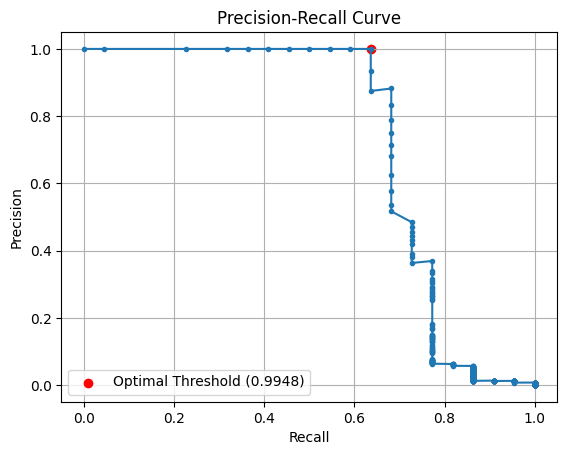

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score, precision_recall_curve, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Use the retrained model (or replace with best_lgbm if not retraining)
model_to_evaluate = lgbm_final  # or best_lgbm

# Predict probabilities on the test set
y_pred_proba = model_to_evaluate.predict_proba(X_test_scaled)[:, 1]

# Define thresholds to evaluate
thresholds_to_test = {
    'Default (0.5)': 0.5,
    'Test(0.7)': 0.7,
    'Optimal (F1)': None  # Will be determined later
}

# Evaluate each threshold
for name, threshold in thresholds_to_test.items():
    if name == 'Optimal (F1)':
        # Compute Precision-Recall curve and optimal threshold
        precision, recall, thresholds_pr = precision_recall_curve(y_test, y_pred_proba)
        f1_scores = np.nan_to_num(2 * (precision * recall) / (precision + recall), nan=0.0)
        optimal_idx = np.argmax(f1_scores)
        threshold = thresholds_pr[optimal_idx]
        thresholds_to_test[name] = threshold  # Store for reference
        print(f"Optimal Threshold for F1-score: {threshold:.4f}")
    
    # Apply the threshold
    y_pred = (y_pred_proba >= threshold).astype(int)
    
    # Classification report
    print(f"\nClassification Report ({name}, Threshold {threshold:.4f}):")
    print(classification_report(y_test, y_pred))
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    print(f"Confusion Matrix ({name}, Threshold {threshold:.4f}):")
    print(f"TN: {cm[0,0]}, FP: {cm[0,1]}")
    print(f"FN: {cm[1,0]}, TP: {cm[1,1]}")

# AUC-ROC score (threshold-independent)
auc_roc = roc_auc_score(y_test, y_pred_proba)
print(f"\nAUC-ROC: {auc_roc:.4f}")

# Average Precision Score (AUC-PR, threshold-independent)
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"Average Precision Score (AUC-PR): {auc_pr:.4f}")

# Plot Precision-Recall curve with optimal threshold marked
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recall, precision, marker='.')
plt.scatter(recall[optimal_idx], precision[optimal_idx], color='red', label=f'Optimal Threshold ({thresholds_to_test["Optimal (F1)"]:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()

In [44]:
import joblib

joblib.dump(lgbm_final, 'lgbm_model_5.pkl')  
joblib.dump(scaler, 'scaler_lgbm.pkl')      

['scaler_lgbm.pkl']

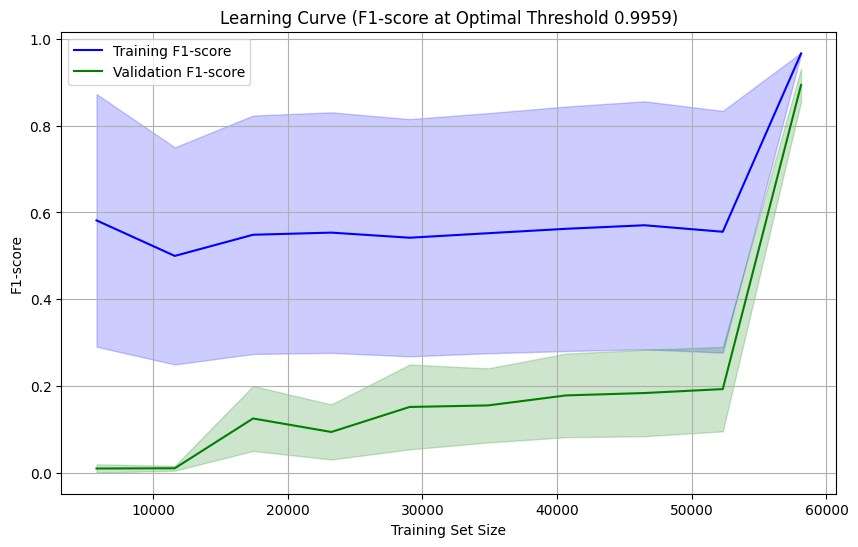

In [33]:
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score, precision_recall_curve, confusion_matrix, f1_score
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Function to compute F1-score at the optimal threshold
def f1_scorer_optimal(estimator, X, y):
    y_pred_proba = estimator.predict_proba(X)[:, 1]
    y_pred = (y_pred_proba >= thresholds_to_test['Optimal (F1)']).astype(int)
    return f1_score(y, y_pred)

# Compute learning curve with cross-validation
train_sizes, train_scores, val_scores = learning_curve(
    model_to_evaluate,  # Use the best model
    X_train_scaled, 
    y_train_smote, 
    cv=5,  # 5-fold cross-validation
    scoring=f1_scorer_optimal,  # Use F1-score at the optimal threshold
    n_jobs=-1,  # Use all CPU cores
    train_sizes=np.linspace(0.1, 1.0, 10)  # Train on 10% to 100% of data
)

# Calculate mean and standard deviation for train and validation scores
train_mean = train_scores.mean(axis=1)
train_std = train_scores.std(axis=1)
val_mean = val_scores.mean(axis=1)
val_std = val_scores.std(axis=1)

# --- Plot Learning Curve ---
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training F1-score', color='blue')
plt.plot(train_sizes, val_mean, label='Validation F1-score', color='green')

# Fill between lines to show standard deviation
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color='green', alpha=0.2)

plt.xlabel('Training Set Size')
plt.ylabel('F1-score')
plt.title(f'Learning Curve (F1-score at Optimal Threshold {thresholds_to_test["Optimal (F1)"]:.4f})')
plt.legend(loc='best')
plt.grid(True)
plt.show()
